<a href="https://colab.research.google.com/github/bambadij/medicament_dataset/blob/main/Dataset_and_Library_medical.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00462/drugsCom_raw.zip

--2023-10-02 12:39:36--  https://archive.ics.uci.edu/ml/machine-learning-databases/00462/drugsCom_raw.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘drugsCom_raw.zip’

drugsCom_raw.zip        [   <=>              ]  41.00M  94.7MB/s    in 0.4s    

2023-10-02 12:39:36 (94.7 MB/s) - ‘drugsCom_raw.zip’ saved [42989872]



In [3]:
!unzip drugsCom_raw.zip

Archive:  drugsCom_raw.zip
  inflating: drugsComTest_raw.tsv    
  inflating: drugsComTrain_raw.tsv   


In [4]:
!pip install scattertext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 23.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flashtext: filename=flashtext-2.7-py2.py3-none-any.whl size=9297 sha256=d11b84c7780bbd4c27d3faa0d102d1209ac6d30edb3a5224a1f95c5d30d49649
  Stored in directory: /root/.cache/pip/wheels/bc/be/39/c37ad168eb2ff644c9685f52554440372129450f0b8ed203dd
Successfully built flashtext


In [5]:
import pandas as pd
from wordcloud import wordcloud
import spacy
import scattertext as st
import matplotlib.pyplot as plt
from IPython.display import IFrame
from IPython.core.display import display,HTML

In [6]:
df1 = pd.read_csv('drugsComTest_raw.tsv',delimiter='\t')
df2 = pd.read_csv('drugsComTrain_raw.tsv',delimiter='\t')
medication_reviews_df = pd.concat([df1,df2])

In [7]:
medication_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215063 entries, 0 to 161296
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   215063 non-null  int64  
 1   drugName     215063 non-null  object 
 2   condition    213869 non-null  object 
 3   review       215063 non-null  object 
 4   rating       215063 non-null  float64
 5   date         215063 non-null  object 
 6   usefulCount  215063 non-null  int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 13.1+ MB


In [10]:
medication_reviews_df.rename(columns={"Unnamed:0" :"uniqueId"},inplace=True)
medication_reviews_df

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,163740,Mirtazapine,Depression,"""I&#039;ve tried a few antidepressants over th...",10.0,"February 28, 2012",22
1,206473,Mesalamine,"Crohn's Disease, Maintenance","""My son has Crohn&#039;s disease and has done ...",8.0,"May 17, 2009",17
2,159672,Bactrim,Urinary Tract Infection,"""Quick reduction of symptoms""",9.0,"September 29, 2017",3
3,39293,Contrave,Weight Loss,"""Contrave combines drugs that were used for al...",9.0,"March 5, 2017",35
4,97768,Cyclafem 1 / 35,Birth Control,"""I have been on this birth control for one cyc...",9.0,"October 22, 2015",4
...,...,...,...,...,...,...,...
161292,191035,Campral,Alcohol Dependence,"""I wrote my first report in Mid-October of 201...",10.0,"May 31, 2015",125
161293,127085,Metoclopramide,Nausea/Vomiting,"""I was given this in IV before surgey. I immed...",1.0,"November 1, 2011",34
161294,187382,Orencia,Rheumatoid Arthritis,"""Limited improvement after 4 months, developed...",2.0,"March 15, 2014",35
161295,47128,Thyroid desiccated,Underactive Thyroid,"""I&#039;ve been on thyroid medication 49 years...",10.0,"September 19, 2015",79


In [11]:
medication_reviews_df['date'].min()

'April 1, 2008'

In [12]:
medication_reviews_df['date'].max()

'September 9, 2017'

Diseases and Medications text visualzationusing WordClouds




In [14]:
from wordcloud import WordCloud


(-0.5, 399.5, 199.5, -0.5)

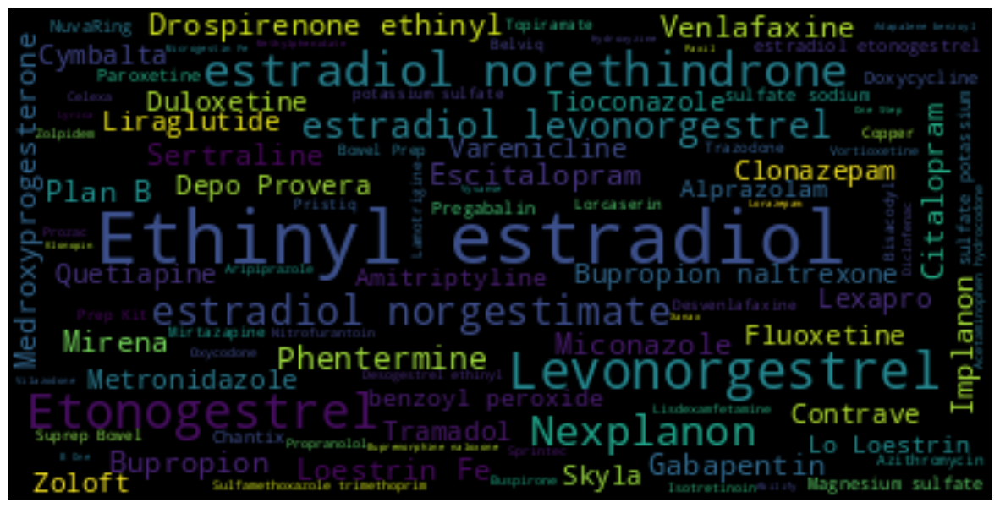

In [15]:
all_drugs = medication_reviews_df['drugName'].to_string()
wordcloud =WordCloud().generate(all_drugs)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")

(-0.5, 399.5, 199.5, -0.5)

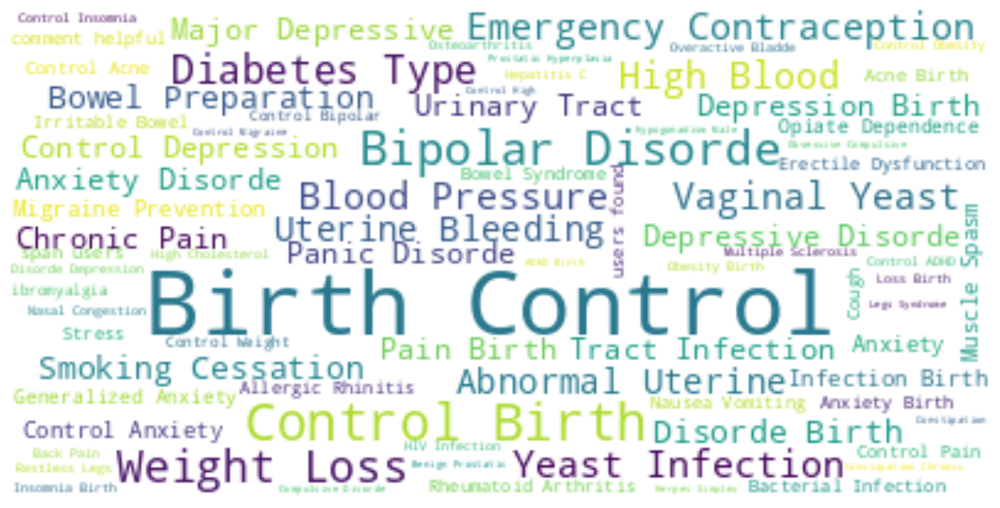

In [16]:
all_conditions = medication_reviews_df['condition'].to_string()
wordcloud =WordCloud(background_color="white").generate(all_conditions)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")

Diseases and Medications text visualzation using Scattertext


In [19]:
nlp =st.WhitespaceNLP.whitespace_nlp_with_sentences
corpus = st.CorpusFromPandas(medication_reviews_df,text_col='condition',category_col='drugName',nlp=nlp).build()

In [22]:
htmL = st.produce_scattertext_explorer(corpus,category='Metoclopramide',category_name='Metoclopramide',not_category_name='All others',width_in_pixels=1210,save_svg_button=True)

In [23]:
display(HTML(htmL))

In [24]:
html2 = st.produce_scattertext_explorer(corpus,category='Ethinyl estradiol / etonogestrel',category_name='Ethinyl estradiol / etonogestrel',not_category_name='All others',width_in_pixels=1210,save_svg_button=True)

In [25]:
display(HTML(html2))